In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/unsupervised-animal-dataset/dataset/1269.jpg
/kaggle/input/unsupervised-animal-dataset/dataset/3863.jpg
/kaggle/input/unsupervised-animal-dataset/dataset/623.jpg
/kaggle/input/unsupervised-animal-dataset/dataset/2193.jpg
/kaggle/input/unsupervised-animal-dataset/dataset/3750.jpg
/kaggle/input/unsupervised-animal-dataset/dataset/2008.jpg
/kaggle/input/unsupervised-animal-dataset/dataset/2081.jpg
/kaggle/input/unsupervised-animal-dataset/dataset/3919.jpg
/kaggle/input/unsupervised-animal-dataset/dataset/3757.jpg
/kaggle/input/unsupervised-animal-dataset/dataset/4489.jpg
/kaggle/input/unsupervised-animal-dataset/dataset/3138.jpg
/kaggle/input/unsupervised-animal-dataset/dataset/3417.jpg
/kaggle/input/unsupervised-animal-dataset/dataset/764.jpg
/kaggle/input/unsupervised-animal-dataset/dataset/4407.jpg
/kaggle/input/unsupervised-animal-dataset/dataset/1700.jpg
/kaggle/input/unsupervised-animal-dataset/dataset/1786.jpg
/kaggle/input/unsupervised-animal-dataset/dataset/2907.jpg

In [ ]:
import os
images_path = []
path_dir = "/kaggle/input/unsupervised-animal-dataset/dataset"
for filepaths in os.listdir("/kaggle/input/unsupervised-animal-dataset/dataset"):
        images_path.append(os.path.join(str(path_dir), str(filepaths)))

In [2]:
print("Total Image path :: ", len(images_path))

Total Image path ::  4738


In [3]:
import time
from tqdm.notebook import tqdm
import warnings
warnings.filterwarnings('ignore')
# For array manipulation
import numpy as np
import pandas as pd
#import pandas.util.testing as tm
# For visualization
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
import cv2
import imageio as io
from pylab import *
from sklearn.manifold import TSNE
#For model performance
from sklearn.metrics import pairwise_distances
from sklearn.metrics.pairwise import cosine_similarity
#from sklearn.externals import joblib
#For model training
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
import tensorflow as tf
from tensorflow import keras 
from tensorflow.keras import layers 
from sklearn.neighbors import KNeighborsClassifier
#from tensorflow.keras.models import Sequential
from keras.applications.vgg16 import preprocess_input
#from tensorflow.keras.layers import Conv2D, Activation, MaxPooling2D, UpSampling2D
#from tensorflow.keras.optimizers import Adam, Adagrad, RMSprop
#from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
#from keras import backend as K
#from keras.models import load_model
#from keras.preprocessing import image

2024-08-13 07:11:49.799023: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-13 07:11:49.799123: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-13 07:11:49.918005: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [5]:
train_file, test_file = train_test_split(images_path, test_size = 0.15)
print("Total train file is :: ", len(train_file))
print("Total test file is :: ", len(test_file))

Total train file is ::  4027
Total test file is ::  711


(512, 512, 3)


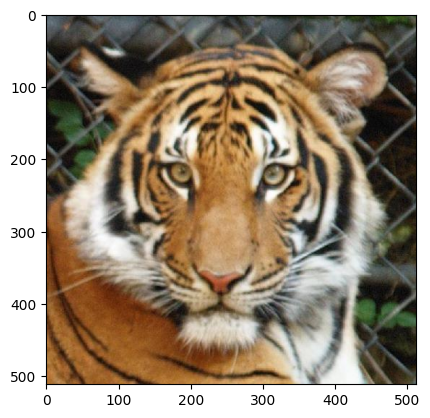

In [6]:
img = cv2.imread(train_file[90])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
print(img.shape)
plt.imshow(img)

In [7]:
def image_array(filepaths):
    img_array = []
    for path in tqdm(filepaths):
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (224, 224))
        img_array.append(np.array(image))

    img_array = np.array(img_array)
    img_array = img_array.reshape(img_array.shape[0], 224, 224, 3)
    img_array = img_array.astype("float32")
    img_array = img_array / 255.0
    return np.array(img_array)

In [8]:
train_data = image_array(train_file)
print("train_data shape is :: ", train_data.shape)

test_data = image_array(test_file)
print("test_data shape is :: ", test_data.shape)

  0%|          | 0/4027 [00:00<?, ?it/s]

train_data shape is ::  (4027, 224, 224, 3)


  0%|          | 0/711 [00:00<?, ?it/s]

test_data shape is ::  (711, 224, 224, 3)


In [9]:
def build_encoder_decoder():

    #Encoder 
    model = keras.Sequential(name='Convolutional_AutoEncoder_Model')
    model.add(layers.Conv2D(64, kernel_size=(3, 3),activation='relu',input_shape=(224, 224, 3),padding='same', name='Encoding_Conv2D_1'))
    model.add(layers.MaxPooling2D(pool_size=(2, 2), strides=2, padding='same', name='Encoding_MaxPooling2D_1'))
    model.add(layers.Conv2D(128, kernel_size=(3, 3),strides=1,kernel_regularizer = tf.keras.regularizers.L2(0.001),activation='relu',padding='same', name='Encoding_Conv2D_2'))
    model.add(layers.MaxPooling2D(pool_size=(2, 2), strides=2, padding='same', name='Encoding_MaxPooling2D_2'))
    model.add(layers.Conv2D(256, kernel_size=(3, 3), activation='relu',kernel_regularizer= tf.keras.regularizers.L2(0.001), padding='same', name='Encoding_Conv2D_3'))
    model.add(layers.MaxPooling2D(pool_size=(2, 2), strides=2, padding='same', name='Encoding_MaxPooling2D_3'))
    model.add(layers.Conv2D(512, kernel_size=(3, 3), activation='relu',kernel_regularizer= tf.keras.regularizers.L2(0.001), padding='same', name='Encoding_Conv2D_4'))
    model.add(layers.MaxPooling2D(pool_size=(2, 2), strides=2,padding='valid', name='Encoding_MaxPooling2D_4'))
    model.add(layers.Conv2D(512, kernel_size=(3, 3), activation='relu', padding='same', name='Encoding_Conv2D_5'))
    model.add(layers.MaxPooling2D(pool_size=(2,2), strides=2, padding='valid'))
    
    #Decoder
    model.add(layers.Conv2D(512, kernel_size=(3, 3), kernel_regularizer = tf.keras.regularizers.L2(0.001),activation='relu', padding='same', name='Decoding_Conv2D_1'))
    model.add(layers.UpSampling2D((2, 2), name='Decoding_Upsamping2D_1'))
    model.add(layers.Conv2D(512, kernel_size=(3, 3), kernel_regularizer = tf.keras.regularizers.L2(0.001), activation='relu', padding='same', name='Decoding_Conv2D_2'))
    model.add(layers.UpSampling2D((2, 2), name='Decoding_Upsamping2D_2'))
    model.add(layers.Conv2D(256, kernel_size=(3, 3), kernel_regularizer = tf.keras.regularizers.L2(0.001), activation='relu', padding='same',name='Decoding_Conv2D_3'))
    model.add(layers.UpSampling2D((2, 2),name='Decoding_Upsamping2D_3'))
    model.add(layers.Conv2D(128, kernel_size=(3, 3), activation='relu', kernel_regularizer = tf.keras.regularizers.L2(0.001), padding='same',name='Decoding_Conv2D_4'))
    model.add(layers.UpSampling2D((2, 2),name='Decoding_Upsamping2D_4'))
    model.add(layers.Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer = tf.keras.regularizers.L2(0.001), padding='same',name='Decoding_Conv2D_5'))
    model.add(layers.UpSampling2D((2, 2),name='Decoding_Upsamping2D_5'))
    model.add(layers.Conv2D(3, kernel_size=(3, 3), padding='same',activation='sigmoid',name='Decoding_Output'))
    return model

In [18]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model

def encoder_decoder_model():
    # Pretrained VGG16 model as the encoder
    vgg = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    vgg.trainable = True
    for layer in vgg.layers[:-4]:  # Fine-tune the last 4 layers
        layer.trainable = False

    # Extract feature maps from the last block
    encoded_output = vgg.get_layer("block5_conv3").output

    # Decoder
    x = layers.Conv2D(512, kernel_size=(3, 3), activation='relu', padding='same')(encoded_output)
    x = layers.Dropout(0.5)(x)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2D(256, kernel_size=(3, 3), activation='relu', padding='same')(x)
    x = layers.Dropout(0.5)(x)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same')(x)
    x = layers.Dropout(0.5)(x)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2D(64, kernel_size=(3, 3), activation='relu', padding='same')(x)
    x = layers.Dropout(0.5)(x)
    x = layers.UpSampling2D((2, 2))(x)
    decoded_output = layers.Conv2D(3, kernel_size=(3, 3), activation='sigmoid', padding='same')(x)

    # Combine encoder and decoder
    model = keras.Model(inputs=vgg.input, outputs=decoded_output, name='Pretrained_VGG16_AutoEncoder')
    return model


Model: "Pretrained_VGG16_AutoEncoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_7 (UpSampling2D)  │ (None, 28, 28, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 28, 28, 256)    │     1,179,904 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_8 (UpSampling2D)  │ (None, 56, 56, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 56, 56, 128)    │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_9 (UpSampling2D)  │ (None, 112, 112, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 112, 112, 64)   │        73,79

 Total params: 18,624,963 (71.05 MB)

 Trainable params: 10,989,699 (41.92 MB)

 Non-trainable params: 7,635,264 (29.13 MB)

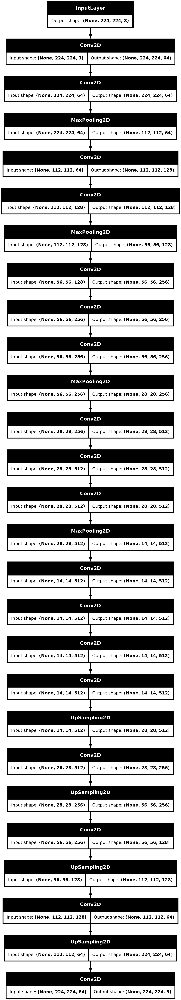

In [19]:
model = encoder_decoder_model()
model.summary()
print("\n")
keras.utils.plot_model(model, show_shapes = True)

## **Hyperparameter Tuning**

In [ ]:
parameters = {'Adagrad':[0.01,0.001,0.0001,0.00001],'Adam':[0.01,0.001,0.0001,0.00001],'Rmsprop':[0.01,0.001,0.0001,0.00001]}
result = []
for i in parameters.keys():
    print("{} as an optimizer:".format(i))
    values = parameters[i]
    result_ = []
    for learning_rate in values:
        print("\t\tUsing learning_rate: "+str(learning_rate))
        model = build_encoder_decoder()
        if i=='Adam':
            optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
        elif i=='Adagrad':
            optimizer = keras.optimizers.Adagrad(learning_rate=learning_rate)
        else:
            optimizer = keras.optimizers.RMSprop(learning_rate=learning_rate)
        model.compile(optimizer=optimizer, loss='mse')             # compiling 
        model.fit(train_data, train_data, epochs=5, batch_size=16,validation_data=(test_data,test_data))  # fitting data
        result_.append(model.history.history)           # taking result to judge the best parameters.
    print()
    result.append(result_)

In [20]:
def plot_(x,y1,y2,row,col,ind,title,xlabel,ylabel,label,isimage=False,color='r'):

    """
    This function is used for plotting images and graphs (Visualization of end results of model training)
    Arguments:
    x - (np.ndarray or list) - an image array
    y1 - (list) - for plotting graph on left side.
    y2 - (list) - for plotting graph on right side.
    row - (int) - row number of subplot
    col - (int) - column number of subplot
    ind - (int) - index number of subplot
    title - (string) - title of the plot 
    xlabel - (list) - labels of x axis
    ylabel - (list) - labels of y axis
    label - (string) - for adding legend in the plot
    isimage - (boolean) - True in case of image else False
    color - (char) - color of the plot (prefered green for training and red for testing).
    """
    
    plt.subplot(row,col,ind)
    if isimage:
        plt.imshow(x)
        plt.title(title)
        plt.axis('off')
    else:
        plt.plot(y1,label=label,color='g'); plt.scatter(x,y1,color='g')
        if y2!='': plt.plot(y2,color=color,label='validation'); plt.scatter(x,y2,color=color)
        plt.grid()
        plt.legend()
        plt.title(title); plt.xlabel(xlabel); plt.ylabel(ylabel)

In [ ]:
min_train = []; min_val = []  
rates = list(parameters.keys())
epochs = [0,1,2,3,4]
for i in result:
    train = []; val = []
    for j in i:
        train.append(min(j['loss'])); val.append(min(j['val_loss']))  # taking minimum loss of each optimizer over all learning rates.
    min_train.append(min(train)); min_val.append(min(val))
plt.figure(figsize=(20,5))
plot_(rates,min_train,min_val,1,2,1,'Minimum loss given by each Optimizer','Optimizer','Loss','training',False,'r')
# plotting the result of adam with learning rate = 0.001 .
plot_(epochs, result[1][1]['loss'],result[1][1]['val_loss'],1,2,2,'Loss on each epochs using Adam with learning rate = 0.001','Epochs','loss','training',False,'r')
plt.show()

- After training the model with different optimizers(Adagrad, Adam, Rmsprop), adam giving the least local minimum loss on training with learning rate = 0.001.
- Both training loss and validation loss are almost equal and we can see our model training is not prone to overfitting and underfitting.
- Achieved 0.0093 on five epochs using Adam(0.001)(optimal value).

In [ ]:
optimizer = keras.optimizers.Adam(learning_rate = 0.001)
model = encoder_decoder_model()
model.compile(optimizer = optimizer, loss = "mse") 


early_stopping_cb = keras.callbacks.EarlyStopping(monitor = "val_loss",
                                                  mode = "min", 
                                                  patience = 6,
                                                  min_delta = 0.0001)

"""
reduce_lr = keras.callbacks.ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.1,
    patience=5,
    verbose=0,
    mode="min",
    min_delta=0.0001)
"""    
    
model_checkpoint = keras.callbacks.ModelCheckpoint(
    "encoder_model.keras",
    monitor = "val_loss",
    mode = "min",
    save_best_only = True)


model.fit(
    train_data, train_data,
    batch_size = 32,
    epochs = 10,
    validation_data = (test_data, test_data),
    callbacks = [
        early_stopping_cb, 
        model_checkpoint,
      #  reduce_lr 
        ]
    )
    

Epoch 1/10
126/126 ━━━━━━━━━━━━━━━━━━━━ 52s 378ms/step - loss: 0.0694 - val_loss: 0.0516
Epoch 2/10
126/126 ━━━━━━━━━━━━━━━━━━━━ 39s 308ms/step - loss: 0.0509 - val_loss: 0.0517
Epoch 3/10
126/126 ━━━━━━━━━━━━━━━━━━━━ 40s 317ms/step - loss: 0.0515 - val_loss: 0.0516
Epoch 4/10
126/126 ━━━━━━━━━━━━━━━━━━━━ 40s 316ms/step - loss: 0.0512 - val_loss: 0.0515
Epoch 5/10
126/126 ━━━━━━━━━━━━━━━━━━━━ 40s 316ms/step - loss: 0.0510 - val_loss: 0.0514
Epoch 6/10
126/126 ━━━━━━━━━━━━━━━━━━━━ 40s 316ms/step - loss: 0.0509 - val_loss: 0.0513
Epoch 7/10
126/126 ━━━━━━━━━━━━━━━━━━━━ 39s 310ms/step - loss: 0.0510 - val_loss: 0.0513
Epoch 8/10
118/126 ━━━━━━━━━━━━━━━━━━━━ 2s 279ms/step - loss: 0.0509

In [23]:
model = keras.models.load_model("encoder_model.keras")
model.compile(optimizer = optimizer, loss = "mse")

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
(1, 224, 224, 3)


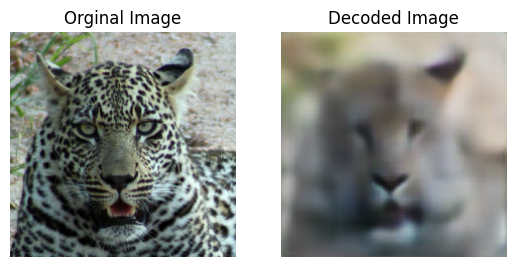

In [24]:
sample_image = train_data[3]
sample_image = np.expand_dims(sample_image,axis=0)
image = model.predict(sample_image)
print(image.shape)
plot_(sample_image[0,:,:,:],'','',1,2,1,"Orginal Image","","","",True)
plot_(image[0,:,:],'','',1,2,2,"Decoded Image","","","",True)
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 792ms/step


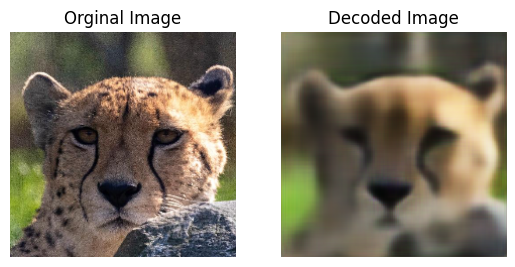

In [26]:
model = keras.models.load_model('encoder_model.keras')
sample_image = train_data[15]
sample_image = np.expand_dims(sample_image,axis=0)
image = model.predict(sample_image)
plot_(train_data[15],'','',1,2,1,"Orginal Image","","","",True)
plot_(image[0,:,:],'','',1,2,2,"Decoded Image","","","",True)
plt.show()

- Restorations seems really satisfactory. Images on the left side are original images whereas images on the right side are restored from compressed representation.

- Decoded image is much flexible and efficient to work rather than working with original image since the compressed representation takes 8 times less space to original image.

## **Feature Extraction:**


In [15]:
def feature_extraction(model, data, layer=4):
    """
    Function to extract features from an intermediate layer of the model.

    Arguments:
    model -- (tf.keras.Model) Trained model
    data -- (np.ndarray) List of images to get feature extraction from the trained model
    layer -- (int) Index of the layer to take the features from (default is 4)

    Returns:
    pooled_array -- (np.ndarray) Array of extracted features of the given images
    """
    # Create a new model that outputs the features from the specified layer
    feature_model = keras.Model(inputs=model.layers[0].input, outputs=model.layers[layer].output)

    # Get the output of the layer for the given data
    encoded_array = feature_model.predict(data)

    # Apply max pooling along the last axis (if needed)
    pooled_array = encoded_array.max(axis=-1)
    
    return encoded_array

# Example usage:
encoded = feature_extraction(model, train_data[:10], 12)


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


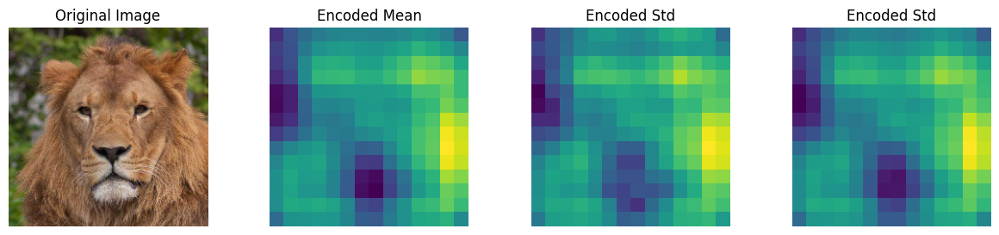

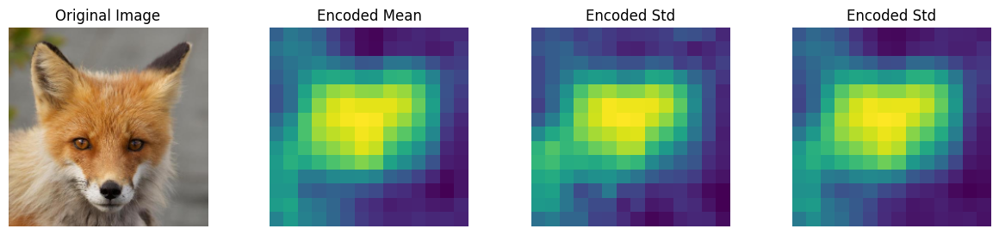

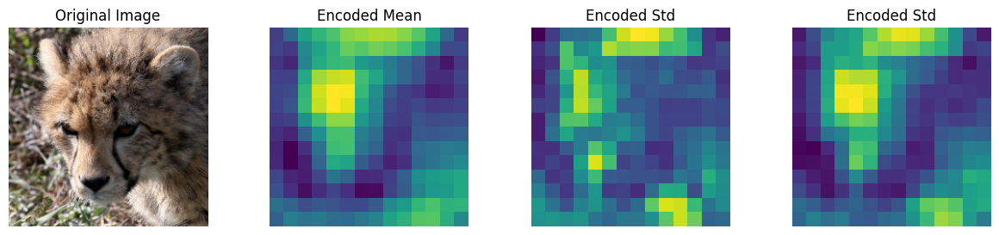

In [16]:
for index in [2,7,9]:   # 3 random images
    plt.figure(figsize=(15,3))
    plot_(train_data[index],'','',1,4,1,"Original Image","","",'',True)
    plot_(encoded[index].mean(axis=-1),'','',1,4,2,"Encoded Mean","","",'',True)
    plot_(encoded[index].max(axis=-1),'','',1,4,3,"Encoded Std","","",'',True)
    plot_(encoded[index].std(axis=-1),'','',1,4,4,"Encoded Std","","",'',True)
    plt.show()

- Extracting features from the 12th layer.
- Dark pixels(yellow) indicates the high activation which helps in differentiating with other images.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


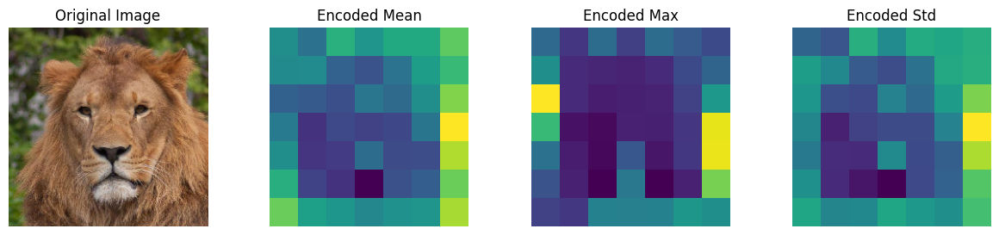

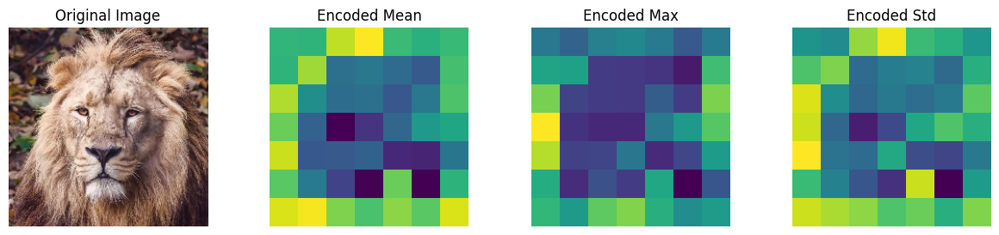

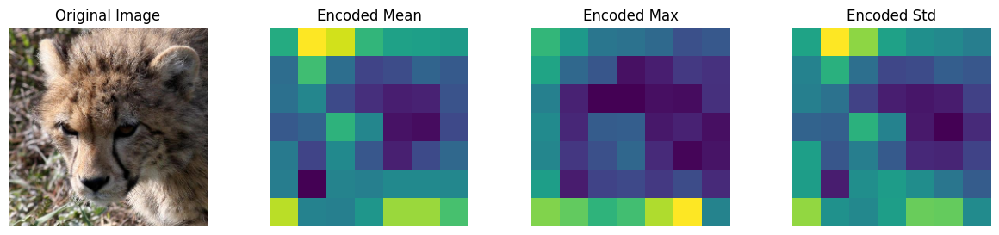

In [17]:
encoded = feature_extraction(model,train_data[:10],9)
for index in [2,6,9]:   # 3 random images
    plt.figure(figsize=(15,3))
    plot_(train_data[index],'','',1,4,1,"Original Image","","",'',True)
    plot_(encoded[index].mean(axis=-1),'','',1,4,2,"Encoded Mean","","",'',True)
    plot_(encoded[index].max(axis=-1),'','',1,4,3,"Encoded Max","","",'',True)
    plot_(encoded[index].std(axis=-1),'','',1,4,4,"Encoded Std","","",'',True)
    plt.show()

Extracting features from the 9th layer. Dark pixels(yellow) indicates the high activation which helps in differentiating with other images.

1. High activation on mane of lion.
2. Nose and lines on tigers.
3. Dots and lines on the nose for cheetah.
4. Nose on foxes. These activation helps in label classification.

In [18]:
def get_batches(data, batch_size=1000):

    """
    Taking batch of images for extraction of images.
    Arguments:
    data - (np.ndarray or list) - list of image array to get extracted features.
    batch_size - (int) - Number of images per each batch
    Returns:
    list - extracted features of each images
    """

    if len(data) < batch_size:
        return [data]
    n_batches = len(data) // batch_size
    
    # If batches fit exactly into the size of df.
    if len(data) % batch_size == 0:
        return [data[i*batch_size:(i+1)*batch_size] for i in range(n_batches)]   

    # If there is a remainder.
    else:
        return [data[i*batch_size:min((i+1)*batch_size, len(data))] for i in range(n_batches+1)]

In [19]:
d = np.concatenate([train_data,test_data],axis=0)
d.shape

(4738, 224, 224, 3)

In [22]:
X_encoded = []
i = 0

# Iterate through the full training set
for batch in get_batches(d, batch_size=300):
    i += 1
    # Run the pooling function on the model for each batch and append the result
    extracted_features = feature_extraction(model, batch, 12)

    # Debugging: Check the shape and type of extracted features
    print(f"Batch {i}: extracted features shape = {extracted_features.shape}, type = {type(extracted_features)}")
    
    # Make sure we're appending only the NumPy array
    X_encoded.append(extracted_features)

# Concatenate all the arrays into a single NumPy array
X_encoded = np.concatenate(X_encoded, axis=0)

# Check the final shape
print(f"Final encoded shape: {X_encoded.shape}")


10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 600ms/step
Batch 1: extracted features shape = (300, 14, 14, 512), type = <class 'numpy.ndarray'>
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step
Batch 2: extracted features shape = (300, 14, 14, 512), type = <class 'numpy.ndarray'>
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step
Batch 3: extracted features shape = (300, 14, 14, 512), type = <class 'numpy.ndarray'>
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step
Batch 4: extracted features shape = (300, 14, 14, 512), type = <class 'numpy.ndarray'>
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step
Batch 5: extracted features shape = (300, 14, 14, 512), type = <class 'numpy.ndarray'>
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step
Batch 6: extracted features shape = (300, 14, 14, 512), type = <class 'numpy.ndarray'>
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step
Batch 7: extracted features shape = (300, 14, 14, 512), type = <class 'numpy.ndarray'>
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step
Batch 8: extracted features shape = (300, 14, 14, 512), type = <class 

In [23]:
X_encoded.shape

(4738, 14, 14, 512)

In [24]:
X_encoded_reshape = X_encoded.reshape(X_encoded.shape[0], X_encoded.shape[1]*X_encoded.shape[2]*X_encoded.shape[3])
print('Encoded shape:', X_encoded_reshape.shape)
np.save('./X_encoded_compressed.npy',X_encoded_reshape)

Encoded shape: (4738, 100352)


In [25]:
X_encoded = np.load('./X_encoded_compressed.npy')
X_encoded.shape


(4738, 100352)

In [26]:
lisp=train_file
lisp.extend(test_file)
print(len(lisp))

4738


# **Dimensionality Reduction through T-SNE:**

In [27]:
transform = TSNE 
trans = transform(n_components=2) 
values = trans.fit_transform(X_encoded_reshape)

In [28]:
def plot_(x,y1,y2,row,col,ind,title,xlabel,ylabel,label,isimage=False,color='b'):

    """
    This function is used for plotting images and graphs (Visualization of end results of model training)
    Arguments:
    x - (np.ndarray or list) - an image array
    y1 - (list) - for plotting graph on left side.
    y2 - (list) - for plotting graph on right side.
    row - (int) - row number of subplot 
    col - (int) - column number of subplot
    ind - (int) - index number of subplot
    title - (string) - title of the plot 
    xlabel - (list) - labels of x axis
    ylabel - (list) - labels of y axis
    label - (string) - for adding legend in the plot
    isimage - (boolean) - True in case of image else False
    color - (char) - color of the plot (prefered green for training and red for testing).
    """
    
    plt.subplot(row,col,ind)
    if isimage:
        plt.imshow(x)
        plt.title(title)
        plt.axis('off')
    else:
        plt.plot(y1,label=label,color='g'); plt.scatter(x,y1,color='g')
        if y2!='': plt.plot(y2,color=color,label='validation'); plt.scatter(x,y2,color=color)
        plt.grid()
        plt.legend()
        plt.title(title); plt.xlabel(xlabel); plt.ylabel(ylabel)

## **Clustering Image Data:(K-Means)**

if Number of clusters: 4


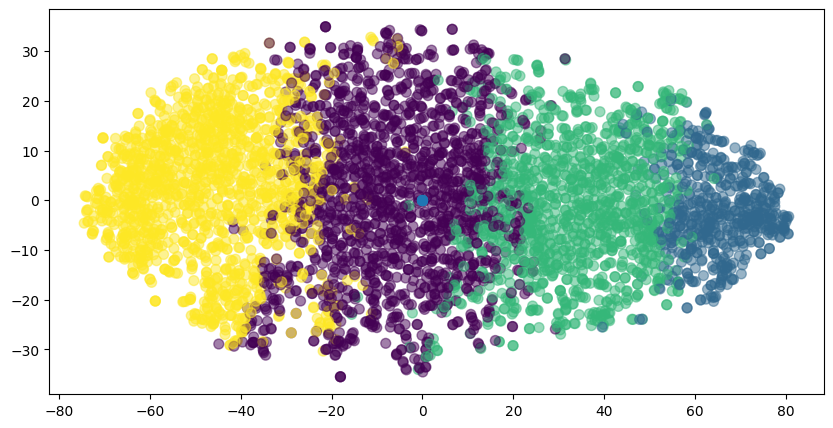

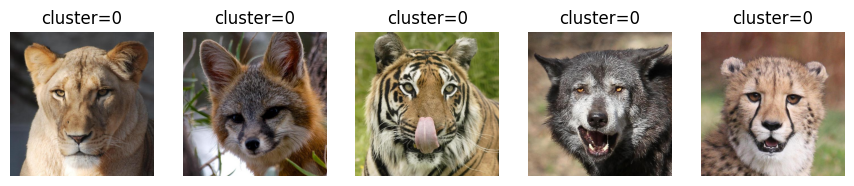

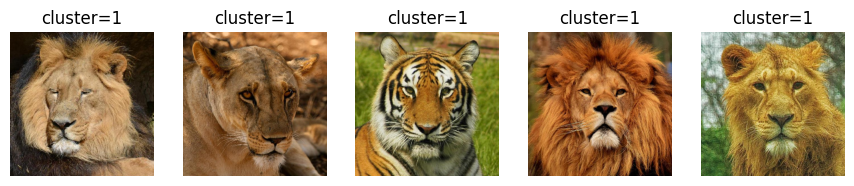

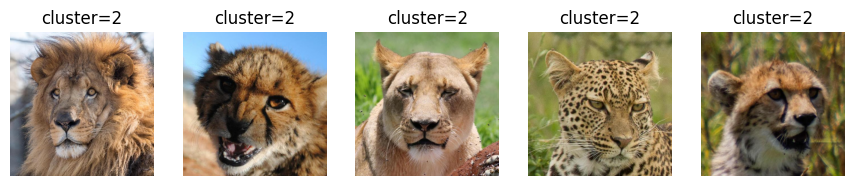

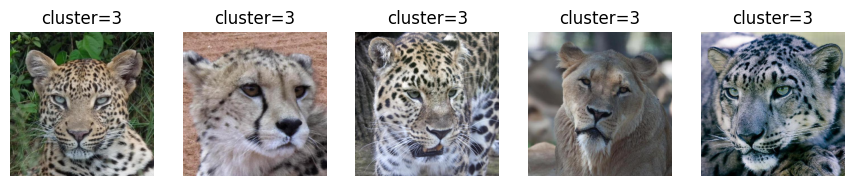


if Number of clusters: 5


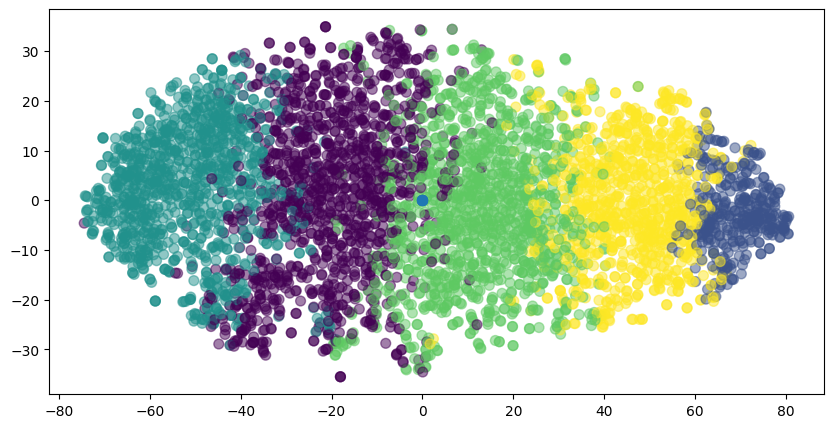

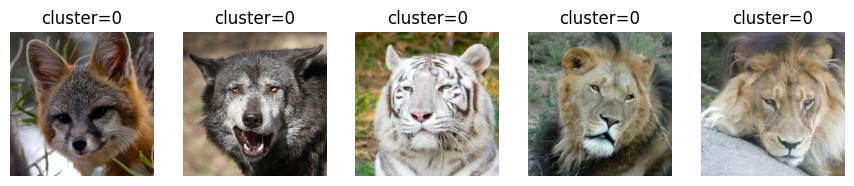

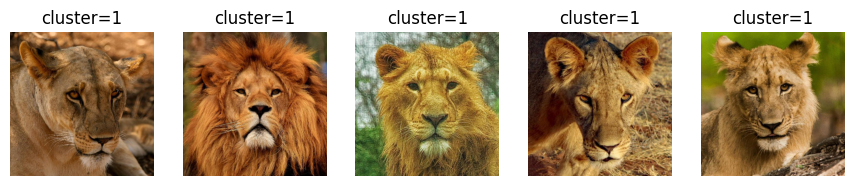

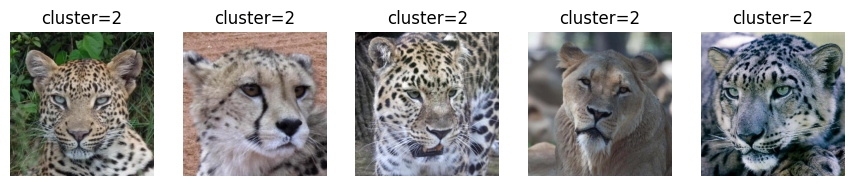

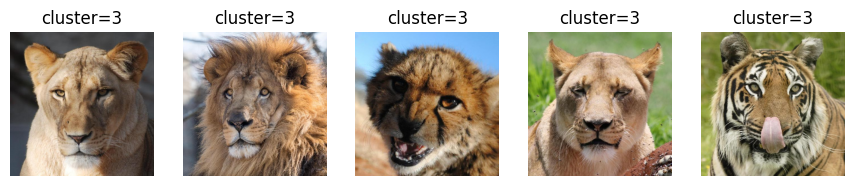

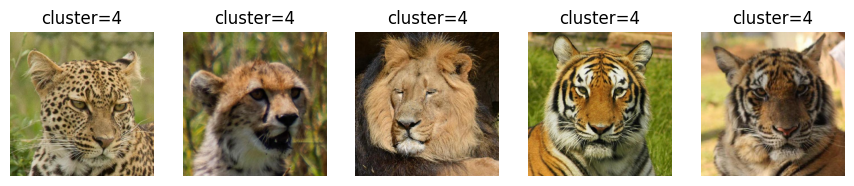


if Number of clusters: 6


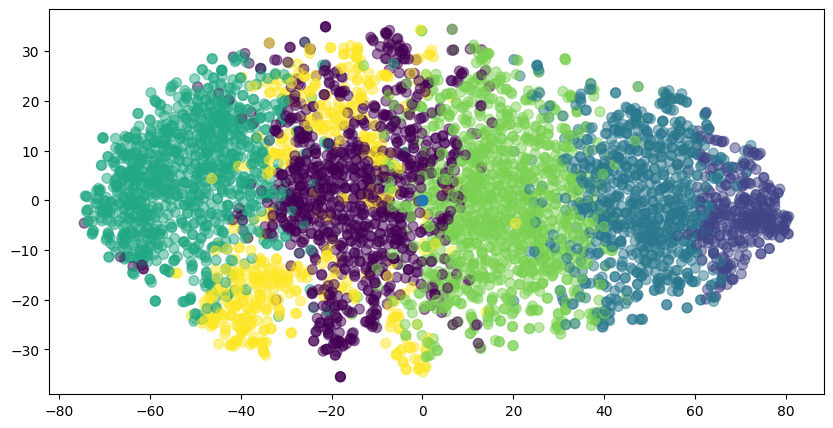

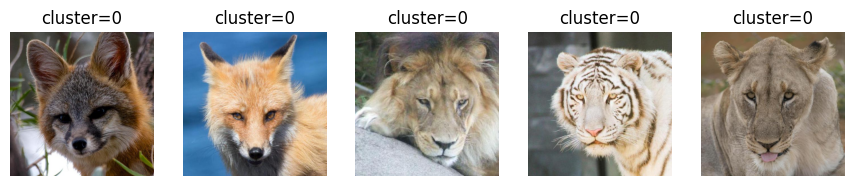

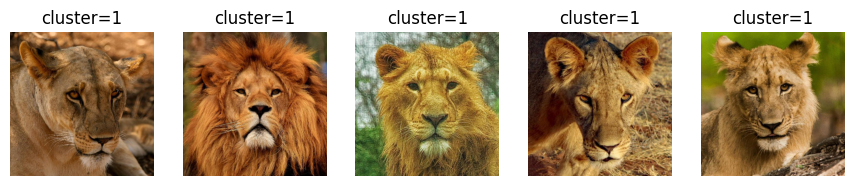

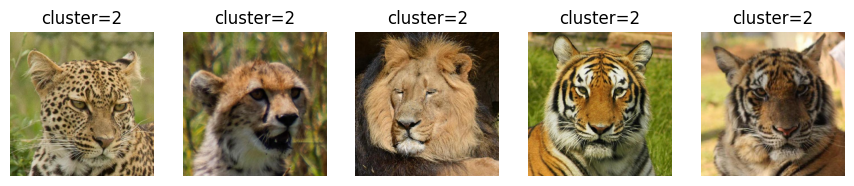

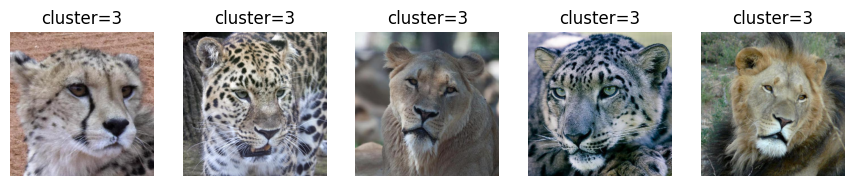

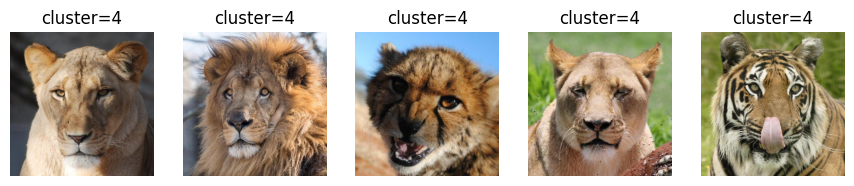

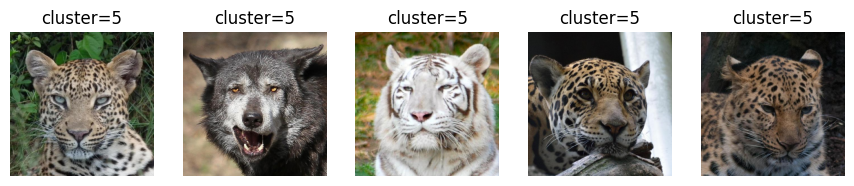


if Number of clusters: 7


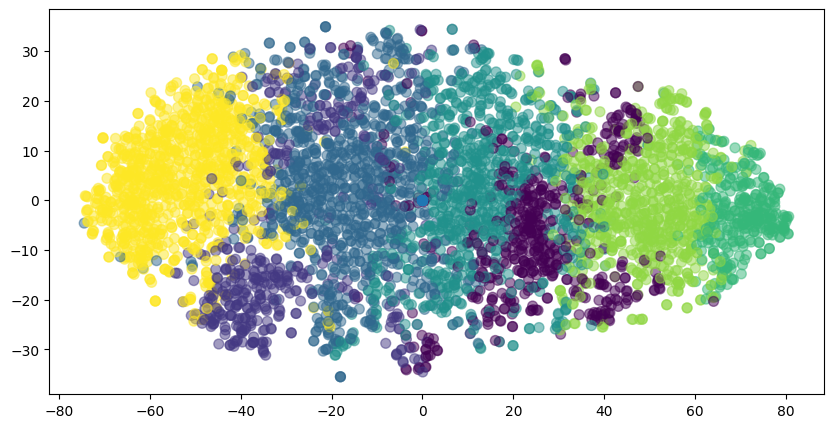

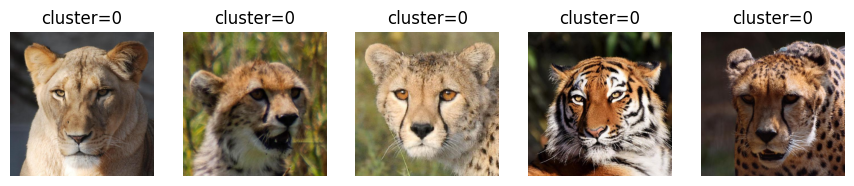

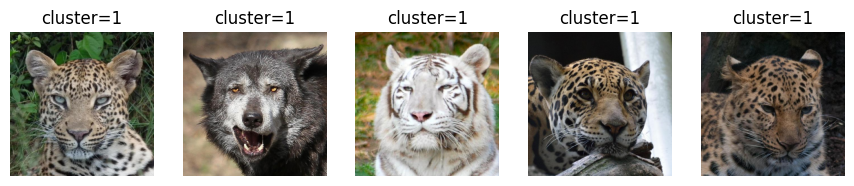

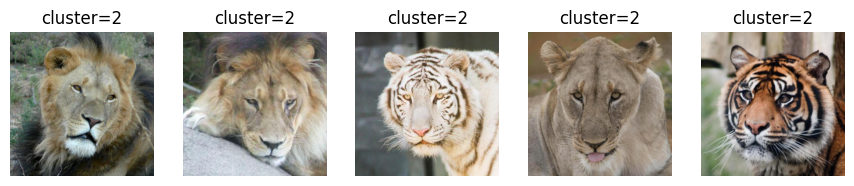

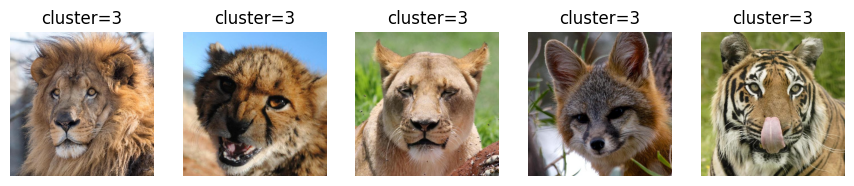

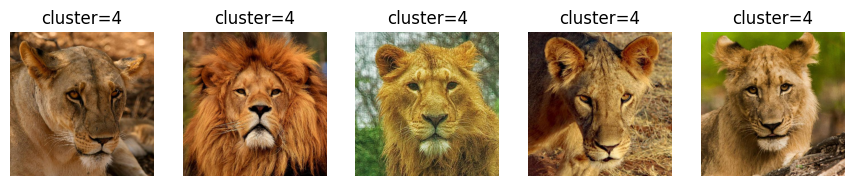

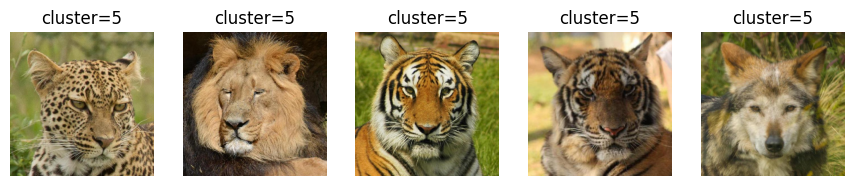

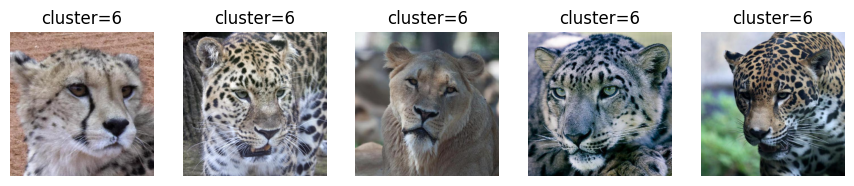

In [29]:
K = [4,5,6,7]
for k in K:
    print("if Number of clusters: "+str(k))
    kmeans = KMeans(n_clusters = k, random_state=0).fit(X_encoded_reshape)
    labels=kmeans.labels_
    centroids = kmeans.cluster_centers_
    plt.figure(figsize=(10,5)) 
    plt.subplot(1,1,1)
    plt.scatter(values[:,0], values[:,1], c= kmeans.labels_.astype(float), s=50, alpha=0.5)
    plt.scatter(centroids[:, 0], centroids[:, 1], c=None, s=50)
    plt.show()
    for row in range(k): 
        iter=0
        plt.figure(figsize=(13,3))
        for i,iterator in enumerate(labels):
            if iterator == row:
                img = cv2.imread(lisp[i])
                img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
                plot_(img,"","",1,6,iter+1,"cluster="+str(row),"","","",True)
                iter+=1
            if iter>=5: break
        plt.show()
    print()

In [30]:
#Training the model with optimial K value (6 in our case)
kmeans = KMeans(n_clusters = 6, random_state=0).fit(X_encoded_reshape)
labels=kmeans.labels_
centroids = kmeans.cluster_centers_

In [31]:
clusters_features = []
cluster_files=[]
for i in [0,1,2,3,4,5]:
    i_cluster = []
    i_labels=[]
    for iter,j in enumerate(kmeans.labels_):
        if j==i:
            i_cluster.append(X_encoded_reshape[iter])
            i_labels.append(lisp[iter])
    i_cluster = np.array(i_cluster)
    clusters_features.append(i_cluster)
    cluster_files.append(i_labels)

In [32]:
labels=[]
data=[]
files=[]
for iter,i in enumerate(clusters_features):
    data.extend(i)
    labels.extend([iter for i in range(i.shape[0])])
    files.extend(cluster_files[iter])
print(np.array(labels).shape)
print(np.array(data).shape)
print(np.array(files).shape)

(4738,)
(4738, 100352)
(4738,)


## **Finding Nearest Neighbors(K-NN):**

In [34]:
from matplotlib.colors import ListedColormap


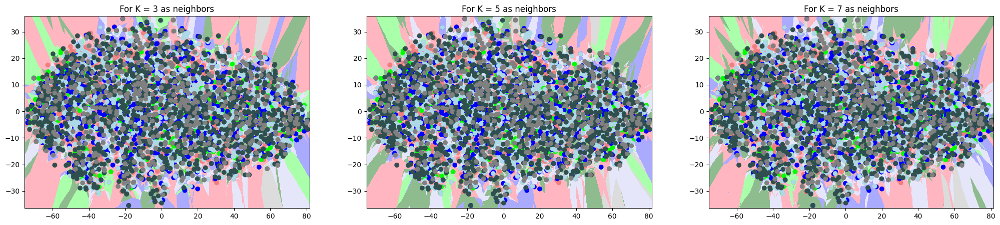

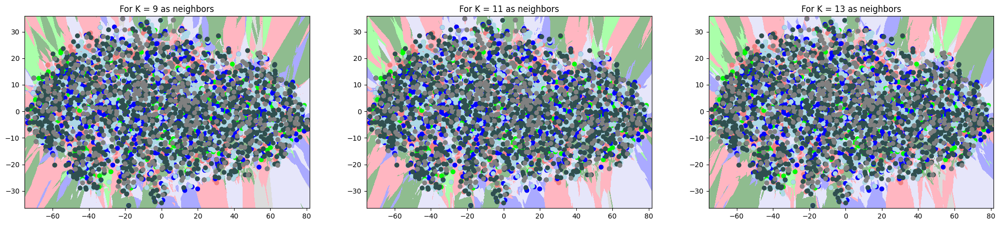

In [35]:
for i in [[3,5,7],[9,11,13]]:
    plt.figure(figsize=(25,5))
    for iter,j in enumerate(i):
        n_neighbors = j
        X = values  
        y = labels
        h = .09  # step size in the mesh
        cmap_light = ListedColormap(['#FFB6C1', '#AAFFAA', '#AAAAFF','#E6E6FA','#8FBC8F','#DCDCDC'])
        cmap_bold = ListedColormap(['#F08080', '#00FF00', '#0000FF','#ADD8E6','#2F4F4F','#808080'])
        clf = KNeighborsClassifier(n_neighbors)
        clf.fit(X, y)

        x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1 
        y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1 
        xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
        Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])

        plt.subplot(1,3,iter+1)
        Z = Z.reshape(xx.shape)
        plt.pcolormesh(xx, yy, Z, cmap=cmap_light)

        # Plot also the training points 
        plt.scatter(X[:, 0], X[:, 1], c=y, cmap=cmap_bold)
        plt.xlim(xx.min(), xx.max())
        plt.ylim(yy.min(), yy.max())
        plt.title("For K = {} as neighbors".format(j))
    plt.show()    

**Training the model with optimal hyperparameter:**

In [36]:
knn = KNeighborsClassifier(n_neighbors=9,algorithm='ball_tree',n_jobs=-1)
knn.fit(np.array(data),np.array(labels))

KNeighborsClassifier(algorithm='ball_tree', n_jobs=-1, n_neighbors=9)

In [39]:
def results_(query,result):
    
    """
    Plotting the N similar images from the dataset with query image.
    Arguments:
    query - (string) - filename of the query image
    result - (list) - filenames of similar images
    """

    def read(img):
        image = cv2.imread(img)
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        return image
    plt.figure(figsize=(10,5))
    if type(query)!=type(30):
        plot_(query,"","",1,1,1,"Query Image","","","",True)
    else:
        plot_(read(files[query]),"","",1,1,1,"Query Image "+files[query],"","","",True)
    plt.show()
    plt.figure(figsize=(20,5))
    for iter,i in enumerate(result):
        plot_(read(files[i]),"","",1,len(result),iter+1,files[i],"","","",True)
    plt.show()

## **Making predictions**

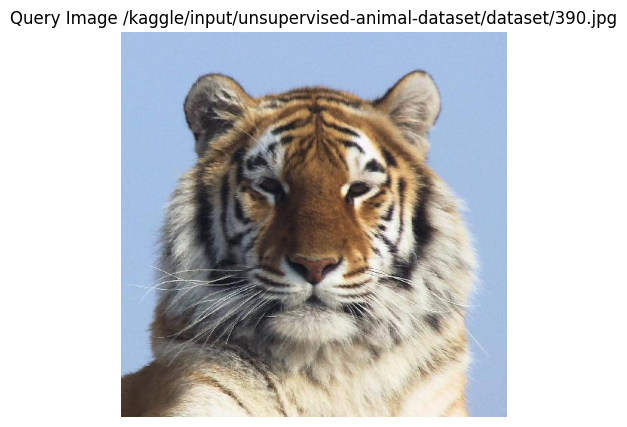

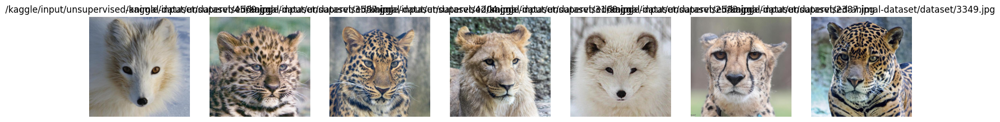

In [40]:
num = 10 #datapoint
res = knn.kneighbors(data[num].reshape(1,-1),return_distance=True,n_neighbors=8)
results_(num,list(res[1][0])[1:])

In [47]:
def predictions(label,N=8,isurl=False):

    """
    Making predictions for the query images and returns N similar images from the dataset.
    We can either pass filename or the url for the image.
    Arguments:
    label - (string) - file name of the query image.
    N - (int) - Number of images to be returned
    isurl - (string) - if query image is from google is set to True else False(By default = False)
    """

    if isurl:
        img = io.imread(label)
        img = cv2.resize(img,(224,224))
    else:
        img_path = label
        img = keras.preprocessing.image.load_img(img_path, target_size=(224,224))
    img_data = keras.preprocessing.image.img_to_array(img)
    img_data = np.expand_dims(img_data,axis=0)
    img_data = preprocess_input(img_data)
    feature = K.function([model.layers[0].input],[model.layers[12].output])
    feature = np.array(feature).flatten().reshape(1,-1)
    res = knn.kneighbors(feature.reshape(1,-1),return_distance=True,n_neighbors=N)
    results_(img,list(res[1][0])[1:])

In [48]:
query_path = '/kaggle/input/unsupervised-animal-dataset/dataset/1011.jpg'
predictions(query_path)

AttributeError: 'list' object has no attribute 'function'

In [ ]:
query_path = '4160.jpg'
predictions(query_path,5)

**Testing with google images:**

In [ ]:
import imageio as io
query_path = 'https://tse4.mm.bing.net/th?id=OIP.NIMP0bTfhF3898t_ZYLB8QHaE8&pid=Api&P=0&w=248&h=166'
predictions(query_path,4,isurl=True)

In [ ]:
query_path = 'https://tse4.mm.bing.net/th?id=OIP.dr7YkzR28BFJerLKJc4cLgHaE7&pid=Api&P=0&w=242&h=162'
predictions(query_path,5,isurl=True)